In [1]:
!pip install ultralytics -q
print("YOLO installed")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 23.6 MB/s eta 0:00:00
YOLO installed


In [2]:
from google.colab import drive
drive.mount('/content/drive')
print("Google Drive mounted")

Mounted at /content/drive
Google Drive mounted


In [3]:
import os

DRIVE_BASE = '/content/drive/MyDrive/Obj_detection_segmentation'
VIDEO_NAME = 'bottle_conveyor-processing.mp4'
OUTPUT_NAME = 'bottle_detected_output.mp4'

VIDEO_PATH  = os.path.join(DRIVE_BASE, VIDEO_NAME)
OUTPUT_PATH = os.path.join(DRIVE_BASE, OUTPUT_NAME)
LOCAL_RAW   = '/content/bottle_detected_raw.mp4'
LOCAL_H264  = '/content/bottle_detected_h264.mp4'

assert os.path.exists(VIDEO_PATH), (
    f'ERROR: Video not fount at: {VIDEO_PATH}\n'
    f'Check spelling or path to video'
)

size_mb = os.path.getsize(VIDEO_PATH) / 1e6
print(f'Video found: {VIDEO_PATH} ({size_mb:.1f} MB)')
print(f'Output will be saved to {OUTPUT_PATH}')

Video found: /content/drive/MyDrive/Obj_detection_segmentation/bottle_conveyor-processing.mp4 (10.0 MB)
Output will be saved to /content/drive/MyDrive/Obj_detection_segmentation/bottle_detected_output.mp4


In [4]:
from ultralytics import YOLO

MODEL_SIZE = 'yolov8n.pt'
model = YOLO(MODEL_SIZE)

BOTTLE_CLASS_ID = 39
print(f'Model Loaded: {MODEL_SIZE}')
print(f'Tracking -> [{BOTTLE_CLASS_ID}] "{model.names[BOTTLE_CLASS_ID]}"')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Model Loaded: yolov8n.pt
Tracking -> [39] "bottle"


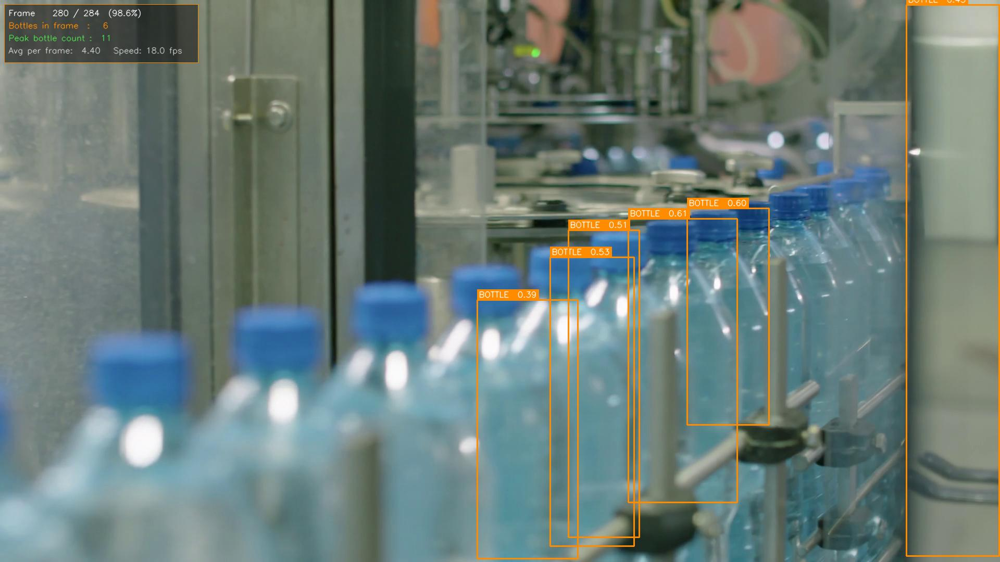

Frame   280/284 | Bottles:  6 | Peak: 11 | Avg: 4.40 | 18.0 fps

Detection complete!
  Frames processed  : 284
  Peak bottle count : 11
  Avg bottles/frame : 4.40
  Total time        : 15.7s  (18.0 fps avg)


In [8]:
import cv2
import numpy as np
from IPython.display import display, Image as IPImage, clear_output
import time

CONF_THRESHOLD  = 0.35   # detection confidence (0.0 to 1.0)
DISPLAY_EVERY_N = 20     # preview every N frames in notebook

BOTTLE_COLOR = (0, 140, 255)   # BGR orange
TEXT_COLOR   = (255, 255, 255)
FONT         = cv2.FONT_HERSHEY_SIMPLEX

cap = cv2.VideoCapture(VIDEO_PATH)
assert cap.isOpened(), f'Cannot open video: {VIDEO_PATH}'

W     = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
H     = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
FPS   = cap.get(cv2.CAP_PROP_FPS) or 25.0
TOTAL = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter(LOCAL_RAW, fourcc, FPS, (W, H))

print(f'Video: {W}x{H} @ {FPS:.1f} fps | {TOTAL} frames total')
print('Detecting bottles...\n')

frame_idx      = 0
peak_count     = 0
cumulative_sum = 0
t0             = time.time()

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # YOLOv8 inference — bottles only
    results = model(
        frame,
        conf=CONF_THRESHOLD,
        classes=[BOTTLE_CLASS_ID],
        verbose=False
    )[0]

    bottle_count = 0

    for box in results.boxes:
        conf            = float(box.conf[0])
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        bottle_count   += 1

        # Draw bounding box
        cv2.rectangle(frame, (x1, y1), (x2, y2), BOTTLE_COLOR, 2)

        # Label badge
        label = f'BOTTLE  {conf:.2f}'
        (tw, th), _ = cv2.getTextSize(label, FONT, 0.52, 1)
        cv2.rectangle(frame, (x1, y1 - th - 8), (x1 + tw + 6, y1), BOTTLE_COLOR, -1)
        cv2.putText(frame, label, (x1 + 3, y1 - 5),
                    FONT, 0.52, TEXT_COLOR, 1, cv2.LINE_AA)

    peak_count     = max(peak_count, bottle_count)
    cumulative_sum += bottle_count
    elapsed        = max(time.time() - t0, 1e-6)
    fps_live       = frame_idx / elapsed
    progress_pct   = frame_idx / TOTAL * 100 if TOTAL else 0
    avg_per_frame  = cumulative_sum / max(frame_idx + 1, 1)

    # HUD overlay
    overlay = frame.copy()
    cv2.rectangle(overlay, (8, 8), (380, 120), (15, 15, 15), -1)
    cv2.addWeighted(overlay, 0.55, frame, 0.45, 0, frame)
    cv2.rectangle(frame, (8, 8), (380, 120), BOTTLE_COLOR, 1)

    hud_lines = [
        (f'Frame  {frame_idx:>5} / {TOTAL}  ({progress_pct:4.1f}%)',              TEXT_COLOR),
        (f'Bottles in frame  : {bottle_count:>3}',                                BOTTLE_COLOR),
        (f'Peak bottle count : {peak_count:>3}',                                  (80, 220, 80)),
        (f'Avg per frame: {avg_per_frame:>5.2f}   Speed: {fps_live:.1f} fps',     (200, 200, 200)),
    ]
    for i, (txt, col) in enumerate(hud_lines):
        cv2.putText(frame, txt, (16, 30 + i * 24),
                    FONT, 0.52, col, 1, cv2.LINE_AA)

    writer.write(frame)

    # Notebook preview
    if frame_idx % DISPLAY_EVERY_N == 0:
        clear_output(wait=True)
        _, buf = cv2.imencode('.jpg', frame, [cv2.IMWRITE_JPEG_QUALITY, 75])
        display(IPImage(data=buf.tobytes()))
        print(f'Frame {frame_idx:>5}/{TOTAL} | '
              f'Bottles: {bottle_count:>2} | '
              f'Peak: {peak_count:>2} | '
              f'Avg: {avg_per_frame:.2f} | '
              f'{fps_live:.1f} fps')

    frame_idx += 1

cap.release()
writer.release()

print(f'\nDetection complete!')
print(f'  Frames processed  : {frame_idx}')
print(f'  Peak bottle count : {peak_count}')
print(f'  Avg bottles/frame : {cumulative_sum/max(frame_idx,1):.2f}')
print(f'  Total time        : {elapsed:.1f}s  ({fps_live:.1f} fps avg)')


In [9]:
import shutil

print('Re-encoding to H.264 for broad compatibility...')
!ffmpeg -y -i {LOCAL_RAW} \
        -vcodec libx264 -crf 22 -preset fast \
        -movflags +faststart \
        {LOCAL_H264} -loglevel error

shutil.copy2(LOCAL_H264, OUTPUT_PATH)

out_mb = os.path.getsize(OUTPUT_PATH) / 1e6
print(f'Output saved to Google Drive!')
print(f' MyDrive/Obj_detection_segmentation/{OUTPUT_NAME}  ({out_mb:.1f} MB)')

Re-encoding to H.264 for broad compatibility...
Output saved to Google Drive!
 MyDrive/Obj_detection_segmentation/bottle_detected_output.mp4  (9.1 MB)


In [10]:
# Play output video inline in notebook
from IPython.display import HTML
from base64 import b64encode

with open(LOCAL_H264, 'rb') as f:
    b64 = b64encode(f.read()).decode()

HTML(f'''
<h3 style="font-family:sans-serif;color:#ff8c00">🍾 Bottle Detection — Output Preview</h3>
<video width="960" controls autoplay loop
       style="border:2px solid #ff8c00;border-radius:8px;max-width:100%">
  <source src="data:video/mp4;base64,{b64}" type="video/mp4">
</video>
<p style="font-family:sans-serif;color:#888;font-size:13px">
  Saved to: <code>MyDrive/Obj_detection_segmentation/bottle_detected_output.mp4</code>
</p>
''')